# Project 4: "Weather Forecast Post-Processing": Group Project Exercise Sheet

Group 8: Deepak Reddy Chinthaparthy, Khuzaima Aziz, Ali Bagheri ,Muhammad Abdul Wasay Khalid 

Linear Method - Principal Component Regression (PCR)







In [2]:
library(fields)
library(maps)
library(zoo)
library(pls)
library(caret)
library(ggplot2)

getwd()

[1] "/home/sc.uni-leipzig.de/dn020mlae/group_project4/submission"

Let's load the data and do some basic plotting of the observed 2-metre temperature and the corresponding NWP forecast. Note that we will also refer to the latter as DMO (direct model output) to distinguish it from the postprocessed forecast.

In [3]:
# Load RDS files
fcs.test <- readRDS("../data/ESSD_benchmark_test_data_forecasts.rds")
fcs.train <- readRDS("../data/ESSD_benchmark_training_data_forecasts.rds")
obs.train <- readRDS("../data/ESSD_benchmark_training_data_observations.rds")
obs.test <- readRDS("../data/ESSD_benchmark_test_data_observations_4students.rds")



In [6]:
##~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
## -- 1 -- Combine test data into one table
##~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

### As said, we will build individual models for each station and lead time, so let's
### first pick one of each
this_station <- 460  # station id
this_leadtime <- 120  # hours

idx.lt <- which(obs.test$leadtime == this_leadtime)
idx.sta <- which(obs.test$latlon$station.id == this_station)
obs <- obs.test$data$t2m[idx.lt,,idx.sta]
time <- obs.test$time + this_leadtime * 3600   # leadtime is added to real time
obs <- cbind(obs.test$time, this_leadtime, this_station, obs) # now obs at leadtime lt are combined with true time
obs <- zoo(obs, time)
colnames(obs) <- c('init', 'lt', 'stat', 'obs')

idx.lt <- which(fcs.test$leadtime == this_leadtime)
idx.sta <- which(fcs.test$latlon$station.id == this_station)
dmo <- fcs.test$data$t2m[idx.lt,,idx.sta]


# Extract other parameters from fcs.test$data
tp6 <- fcs.test$data$tp6[idx.lt,,idx.sta]
sshf6 <- fcs.test$data$sshf6[idx.lt,,idx.sta]
slhf6 <- fcs.test$data$slhf6[idx.lt,,idx.sta]
ssr6 <- fcs.test$data$ssr6[idx.lt,,idx.sta]
str6 <- fcs.test$data$str6[idx.lt,,idx.sta]
cp6 <- fcs.test$data$cp6[idx.lt,,idx.sta]
mx2t6 <- fcs.test$data$mx2t6[idx.lt,,idx.sta]
mn2t6 <- fcs.test$data$mn2t6[idx.lt,,idx.sta]
ssrd6 <- fcs.test$data$ssrd6[idx.lt,,idx.sta]
strd6 <- fcs.test$data$strd6[idx.lt,,idx.sta]
p10fg6 <- fcs.test$data$p10fg6[idx.lt,,idx.sta]

# Combine all parameters into the test data frame
test <- cbind(dmo, tp6, sshf6, slhf6, ssr6, str6, cp6, mx2t6, mn2t6, ssrd6, strd6, p10fg6)



#test <- cbind(dmo)  # hint: you can add more predictors here
# the following are possible (+ any transformations/interactions): 
# tp6 sshf6 slhf6 ssr6 str6 cp6 mx2t6 mn2t6 ssrd6 strd6 p10fg6



time <- fcs.test$time + this_leadtime * 3600
test <- zoo(test, time)
test <- merge(obs, test)

## inspect
str(test)
head(test)

‘zoo’ series from 2017-01-06 to 2019-01-05
  Data: num [1:730, 1:16] 1.48e+09 1.48e+09 1.48e+09 1.48e+09 1.48e+09 ...
 - attr(*, "dimnames")=List of 2
  ..$ : NULL
  ..$ : chr [1:16] "init" "lt" "stat" "obs" ...
  Index:  POSIXct[1:730], format: "2017-01-06" "2017-01-07" "2017-01-08" "2017-01-09" "2017-01-10" ...


                 init  lt stat    obs      dmo          tp6  sshf6   slhf6 ssr6
2017-01-06 1483228800 120  460 266.75 268.2239 0.000000e+00 161744   68496    0
2017-01-07 1483315200 120  460 263.65 264.6773 0.000000e+00 121168    6960    0
2017-01-08 1483401600 120  460 269.35 272.0472 5.426407e-04 224432 -235824    0
2017-01-09 1483488000 120  460 273.65 273.3844 4.844666e-04  33952   50832    0
2017-01-10 1483574400 120  460 272.45 271.7579 6.866455e-05 256448  143504    0
2017-01-11 1483660800 120  460 273.75 272.5958 0.000000e+00 343328   22800    0
               str6          cp6    mx2t6    mn2t6 ssrd6   strd6   p10fg6
2017-01-06 -1134192 0.000000e+00 269.7615 267.9926     0 4922384 3.233467
2017-01-07 -1268560 0.000000e+00 267.0220 264.7696     0 4482512 2.172581
2017-01-08     7104 0.000000e+00 272.0276 271.8546     0 6662384 6.422190
2017-01-09    36096 0.000000e+00 273.6523 273.1815     0 6826400 2.060579
2017-01-10  -449680 5.722046e-06 273.7810 271.8229     0 6274928 5.716

In [7]:
##~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
## -- 2 -- Combine train data into one table
##~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

trai.all <- NULL
for(year in fcs.train$year){
    
    idx.lt <- which(obs.train$leadtime == this_leadtime)
    idx.year <- which(obs.train$year == year)
    idx.sta <- which(obs.train$latlon$station.id == this_station)

    obs <- obs.train$data$t2m[idx.lt,idx.year,,idx.sta]
    year.dummy <- as.POSIXct(paste0(2017 - 20 + year,'-01-02'))
    time <- year.dummy + obs.train$time * 3600 * 24 + this_leadtime * 3600
    fctime_obs_trai <- year.dummy + obs.train$time * 3600 * 24
    obs <- cbind(fctime_obs_trai, this_leadtime, this_station, obs)
    obs <- zoo(obs, time)
    colnames(obs) <- c('init', 'lt', 'stat', 'obs')
    
    idx.lt <- which(fcs.train$leadtime == this_leadtime)
    idx.year <- which(fcs.train$year == year)
    idx.sta <- which(fcs.train$latlon$station.id == this_station)
    dmo <- fcs.train$data$t2m[idx.lt,idx.year,,idx.sta]
    
    
    
   
tp6 <- fcs.train$data$tp6[idx.lt,idx.year,,idx.sta]
sshf6 <- fcs.train$data$sshf6[idx.lt,idx.year,,idx.sta]
slhf6 <- fcs.train$data$slhf6[idx.lt,idx.year,,idx.sta]
ssr6 <- fcs.train$data$ssr6[idx.lt,idx.year,,idx.sta]
str6 <- fcs.train$data$str6[idx.lt,idx.year,,idx.sta]
cp6 <- fcs.train$data$cp6[idx.lt,idx.year,,idx.sta]
mx2t6 <- fcs.train$data$mx2t6[idx.lt,idx.year,,idx.sta]
mn2t6 <- fcs.train$data$mn2t6[idx.lt,idx.year,,idx.sta]
ssrd6 <- fcs.train$data$ssrd6[idx.lt,idx.year,,idx.sta]
strd6 <- fcs.train$data$strd6[idx.lt,idx.year,,idx.sta]
p10fg6 <- fcs.train$data$p10fg6[idx.lt,idx.year,,idx.sta]


trai <- cbind(dmo, tp6, sshf6, slhf6, ssr6, str6, cp6, mx2t6, mn2t6, ssrd6, strd6, p10fg6)

    
    
    
    
    #trai <- cbind(dmo)  # hint: you can add more predictors here
    time <- year.dummy + fcs.train$time * 3600 * 24 + this_leadtime * 3600
    
    trai <- zoo(trai, time)
    trai <- merge(obs, trai)
    
    trai.all <- rbind(trai.all, trai)
}

trai <- na.omit(trai.all)
### Using only data for trainig before 2017-01-01
trai <- trai[which(index(trai) < as.POSIXct('2017-01-01')),]

## inspect
head(trai)
str(trai)

                init  lt stat    obs      dmo          tp6   sshf6   slhf6 ssr6
1998-01-07 883695600 120  460 266.65 261.3914 0.000000e+00  870224  103072    0
1998-01-10 883954800 120  460 266.65 268.4775 5.722046e-06    1552 -112928    0
1998-01-14 884300400 120  460 268.25 259.1360 1.576664e-06  559024   68736    0
1998-01-17 884559600 120  460 271.95 273.6677 0.000000e+00 1292624  -10656    0
1998-01-21 884905200 120  460 275.15 274.8578 4.005432e-05  317392   60576    0
1998-01-24 885164400 120  460 278.55 275.0004 0.000000e+00 1131696  -23808    0
               str6 cp6    mx2t6    mn2t6 ssrd6   strd6   p10fg6
1998-01-07 -1514784   0 261.9338 261.3694     0 4053408 6.301232
1998-01-10    57552   0 268.9157 268.4342     0 6446160 5.687511
1998-01-14 -1082768   0 263.2590 259.2949     0 4385712 3.995073
1998-01-17 -1336656   0 273.8364 271.4493     0 5063936 7.311318
1998-01-21  -111728   0 275.6487 274.8923     0 6815776 4.784665
1998-01-24 -1058768   0 277.3025 275.0366     0 58

‘zoo’ series from 1998-01-07 to 2016-12-31
  Data: num [1:3850, 1:16] 8.84e+08 8.84e+08 8.84e+08 8.85e+08 8.85e+08 ...
 - attr(*, "dimnames")=List of 2
  ..$ : NULL
  ..$ : chr [1:16] "init" "lt" "stat" "obs" ...
  Index:  POSIXct[1:3850], format: "1998-01-07 00:00:00" "1998-01-10 00:00:00" "1998-01-14 00:00:00" ...


Loading required package: ggplot2

Warning message in cor(trai_numeric, use = "complete.obs"):
“the standard deviation is zero”


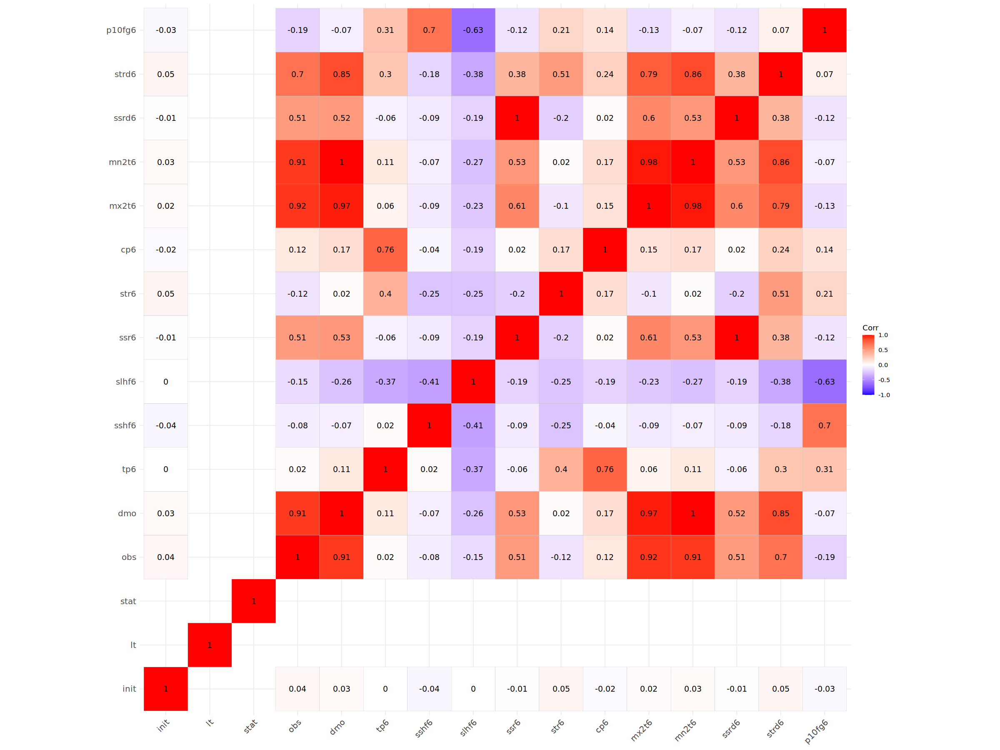

In [17]:
# Load the necessary library
library(ggcorrplot)

# Assuming your data is stored in a data frame named 'trai'
# Remove non-numeric columns if necessary (e.g., 'init' and 'stat' if they are not numeric)
trai_numeric <- trai[, sapply(trai, is.numeric)]

# Calculate the correlation matrix
cor_matrix <- cor(trai_numeric, use = "complete.obs")

# Adjust the size of the plotting window
options(repr.plot.width=20, repr.plot.height=15)  # Set width and height in inches

# Visualize the correlation matrix
ggcorrplot(cor_matrix, lab = TRUE)


So far, we only extracted a sinlge predictor, namely the direct model output (DMO) for 2-metre air temperature. However, intuitively we would expect forecast errors to be affected by seasonality. To capture such a cyclical pattern in the data, we define two new predictors based on the day of the year:

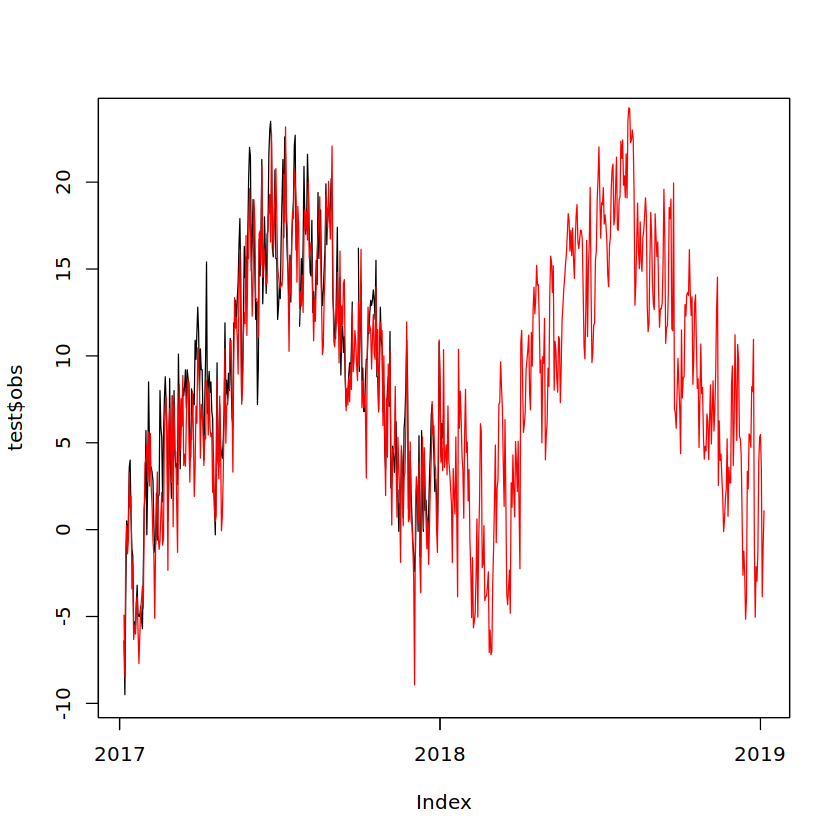

In [8]:
### Convert K to °C (run only once!):
trai$obs <- trai$obs - 273.15
test$obs <- test$obs - 273.15
trai$dmo <- trai$dmo - 273.15
test$dmo <- test$dmo - 273.15


trai$ mx2t6 <- trai$mx2t6  - 273.15
test$ mx2t6<- test$mx2t6 - 273.15
trai$mn2t6<- trai$mn2t6 - 273.15
test$mn2t6 <- test$mn2t6 - 273.15



### Adding sine and cosine for day of the year to capture seasonality

## Decomposing the day of the year into sine and cosine components avoids the
## discontinuity at the end of the year, which is particularly problematic with linear models.


## train set
yday <- as.POSIXlt(index(trai))$yday
trai$sin.doy <- sin(2 * pi * yday / 365)
trai$cos.doy <- cos(2 * pi * yday / 365)

## test set
yday <- as.POSIXlt(index(test))$yday
test$sin.doy <- sin(2 * pi * yday / 365)
test$cos.doy <- cos(2 * pi * yday / 365)

plot(test$obs)
lines(test$dmo, col = "red")

## add more predictors here:
# ...


Warning message in cor(trai_numeric, use = "complete.obs"):
“the standard deviation is zero”


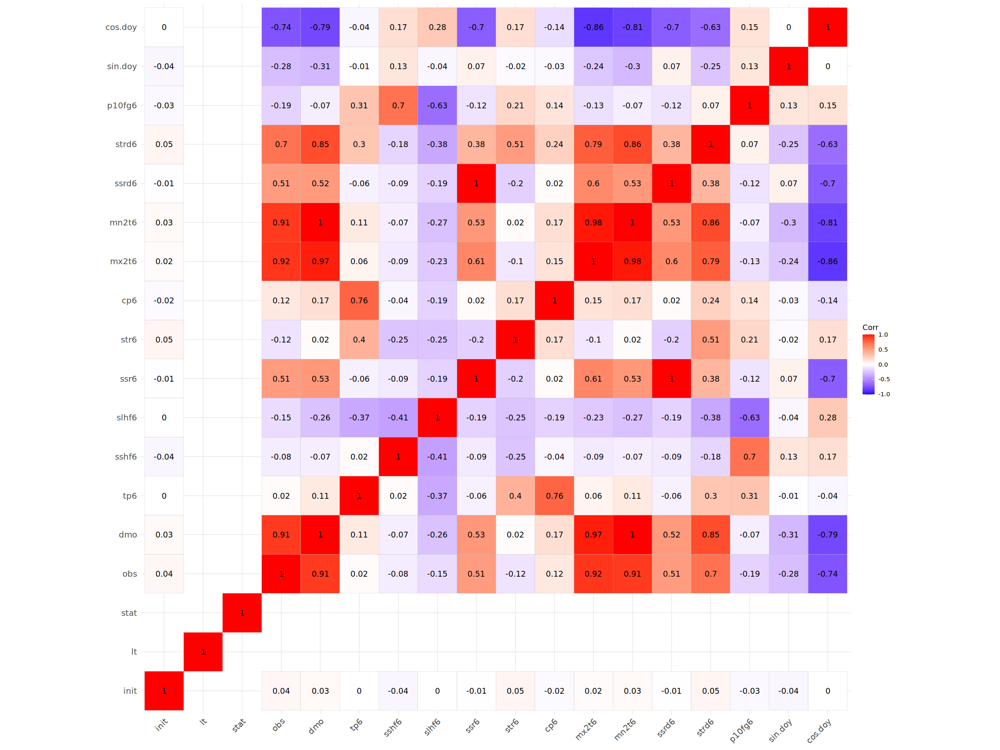

In [19]:
# Load the necessary libraries
library(ggcorrplot)

# Assuming your data is stored in a data frame named 'trai'
# Remove non-numeric columns (e.g., 'init', 'time', and 'stat' if they are not numeric)
trai_numeric <- trai[, sapply(trai, is.numeric)]

# Calculate the correlation matrix
cor_matrix <- cor(trai_numeric, use = "complete.obs")

# Adjust the size of the plotting window
options(repr.plot.width = 20, repr.plot.height = 15)  # Set width and height in inches

# Visualize the correlation matrix
ggcorrplot(cor_matrix, lab = TRUE)

# Principal Component Regression (PCR) Models

We developed four PCR models to predict observed temperature (`obs`) using different combinations of predictor variables. Each model was trained with cross-validation on the training dataset (`trai`) and evaluated on the test dataset (`test`).

**PCR Model 1 - using all varaibles**  
Predictors: `dmo`, `cos.doy`, `sin.doy`, `tp6`, `sshf6`, `slhf6`, `ssr6`, `str6`, `cp6`, `mx2t6`, `mn2t6`, `ssrd6`, `strd6`, `p10fg6`

**PCR Model 2 - using high correlation**  
Predictors: `dmo`, `cos.doy`, `strd6`, `mx2t6`, `mn2t6`

**PCR Model 3 - observation and seasonality**  
Predictors: `dmo`, `cos.doy`, `sin.doy`

**PCR Model 4 - only observation**  
Predictors: `dmo`

We evaluated the models using `summary` and `validationplot`.


Data: 	X dimension: 3850 14 
	Y dimension: 3850 1
Fit method: svdpc
Number of components considered: 14

VALIDATION: RMSEP
Cross-validated using 10 random segments.
       (Intercept)  1 comps  2 comps  3 comps  4 comps  5 comps  6 comps
CV           6.645    2.957    2.909     2.87    2.681    2.581    2.304
adjCV        6.645    2.957    2.908     2.87    2.681    2.581    2.303
       7 comps  8 comps  9 comps  10 comps  11 comps  12 comps  13 comps
CV       2.301    2.289    2.284     2.225     2.219       2.2     2.195
adjCV    2.301    2.289    2.283     2.224     2.219       2.2     2.195
       14 comps
CV        2.196
adjCV     2.195

TRAINING: % variance explained
     1 comps  2 comps  3 comps  4 comps  5 comps  6 comps  7 comps  8 comps
X      39.15    59.56    73.88    83.10    89.97    94.43    96.83    98.23
obs    80.23    80.87    81.37    83.78    84.97    88.03    88.06    88.19
     9 comps  10 comps  11 comps  12 comps  13 comps  14 comps
X      99.32     99.84    

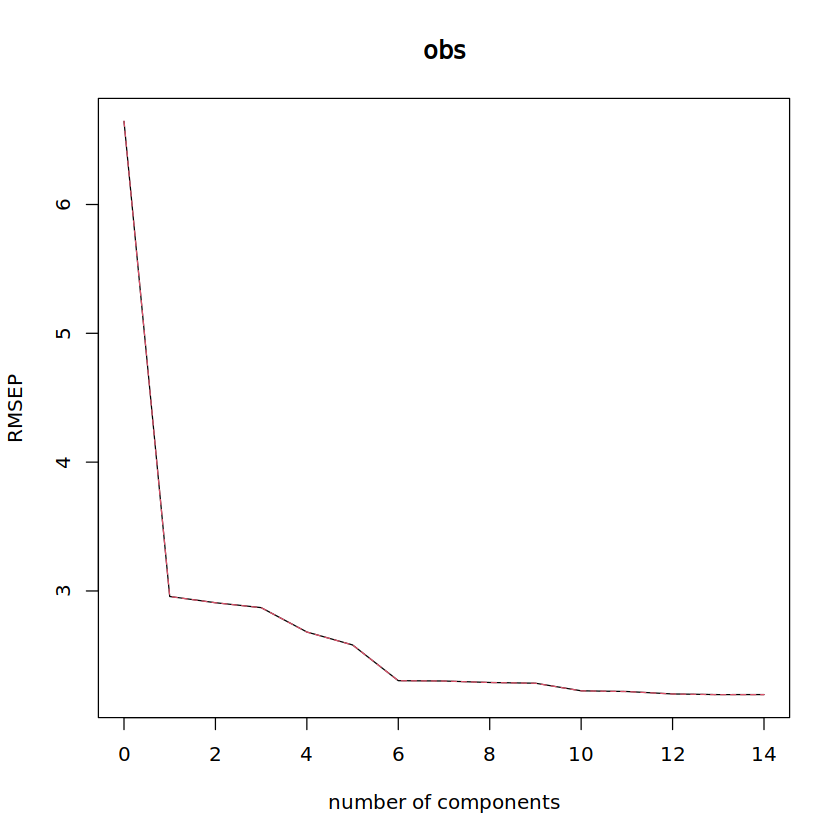

Data: 	X dimension: 3850 3 
	Y dimension: 3850 1
Fit method: svdpc
Number of components considered: 3

VALIDATION: RMSEP
Cross-validated using 10 random segments.
       (Intercept)  1 comps  2 comps  3 comps
CV           6.645    2.737    2.708    2.445
adjCV        6.645    2.737    2.708    2.445

TRAINING: % variance explained
     1 comps  2 comps  3 comps
X      61.23    94.51   100.00
obs    83.04    83.40    86.48


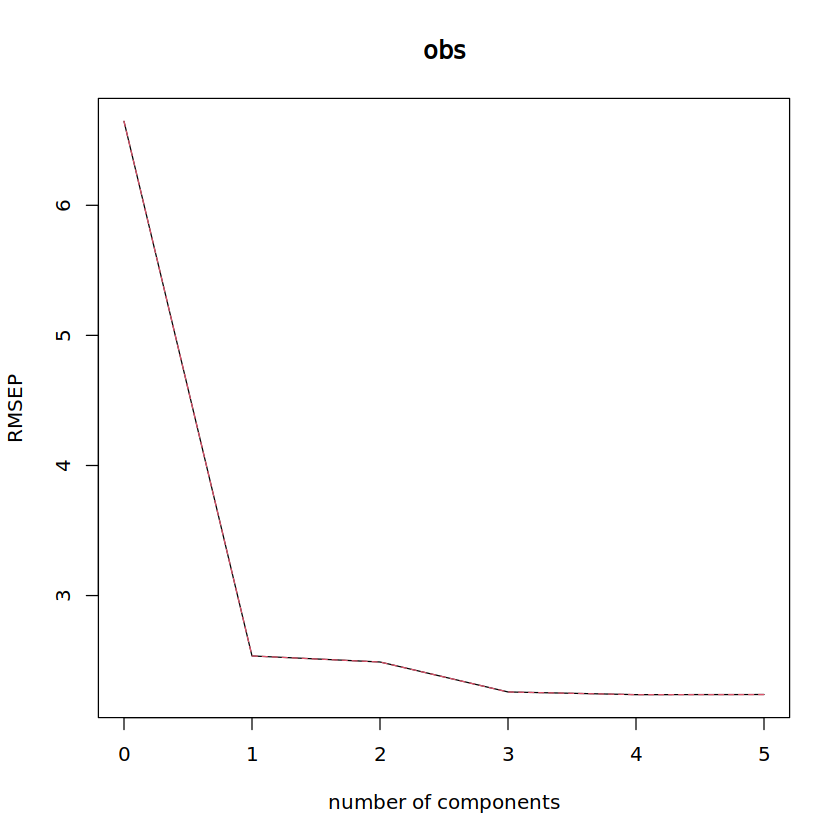

Data: 	X dimension: 3850 1 
	Y dimension: 3850 1
Fit method: svdpc
Number of components considered: 1

VALIDATION: RMSEP
Cross-validated using 10 random segments.
       (Intercept)  1 comps
CV           6.645    2.551
adjCV        6.645    2.551

TRAINING: % variance explained
     1 comps
X     100.00
obs    85.27


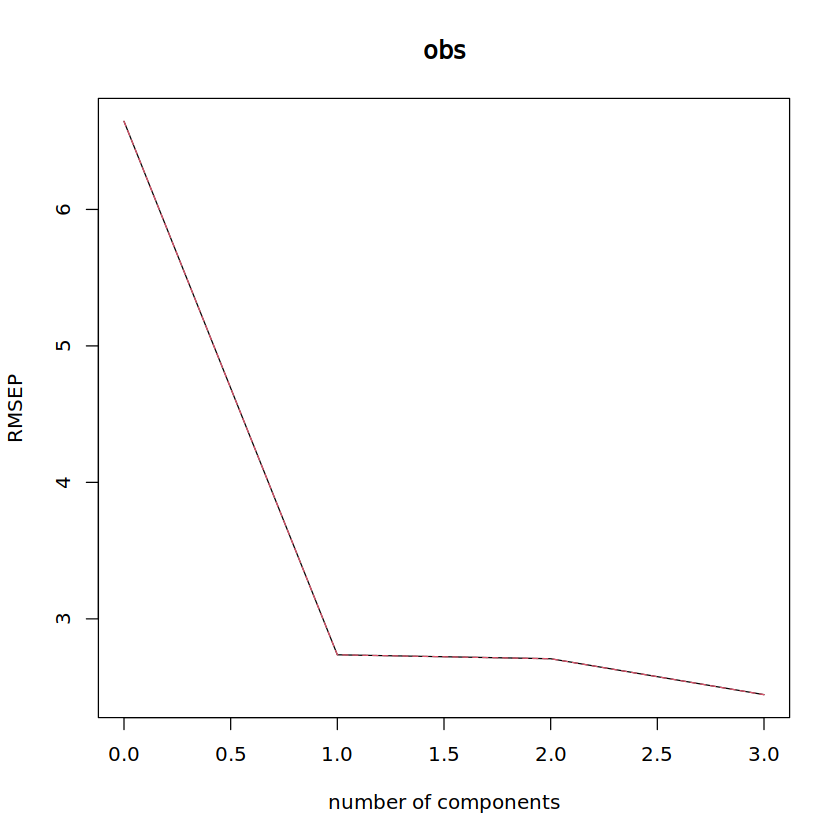

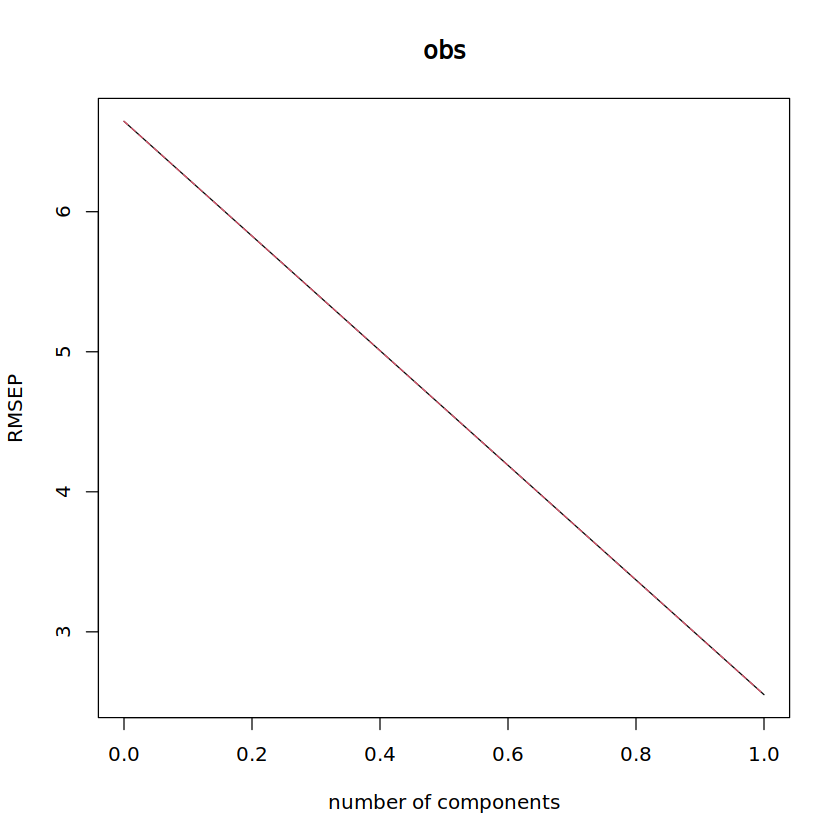

In [9]:


# Create the PCR model with all specified variables
pcr_model1 <- pcr(obs ~ dmo  + cos.doy + sin.doy + tp6 +  sshf6 + slhf6 + ssr6 + str6 + cp6 + mx2t6 + mn2t6 + ssrd6 + strd6 +p10fg6 ,
                 data = trai,
                 scale = TRUE,
                 validation = "CV")




pcr_model2 <- pcr(obs ~ dmo  + cos.doy + strd6 + mx2t6 + mn2t6 ,
                 data = trai,
                 scale = TRUE,
                 validation = "CV")




pcr_model3 <- pcr(obs ~ dmo  + cos.doy + sin.doy ,
                 data = trai,
                 scale = TRUE,
                 validation = "CV")



pcr_model4 <- pcr(obs ~ dmo,
                 data = trai,
                 scale = TRUE,
                 validation = "CV")


summary(pcr_model1)
validationplot(pcr_model1)




summary(pcr_model2)
validationplot(pcr_model2)


summary(pcr_model3)
validationplot(pcr_model3)

summary(pcr_model4)
validationplot(pcr_model4)




pcr_model1_test_subset <- test[, c("dmo", "sin.doy", "cos.doy", "tp6", "sshf6", "slhf6", "ssr6", "str6", "cp6", "mx2t6", "mn2t6", "ssrd6", "strd6", "p10fg6")]


pcr_model2_test_subset <- test[, c("dmo",  "cos.doy",  "strd6","mx2t6","mn2t6")]


pcr_model3_test_subset <- test[, c("dmo", "cos.doy","sin.doy")]


pcr_model4_test_subset <- test[, "dmo", drop = FALSE]


In [10]:
# Make predictions on the test data using the PCR model
pcr_pred1 <- predict(pcr_model1, newdata = pcr_model1_test_subset, ncomp = 11) # Adjust ncomp as needed




pcr_pred2 <- predict(pcr_model2, newdata = pcr_model2_test_subset, ncomp = 3)




pcr_pred3 <- predict(pcr_model3, newdata = pcr_model3_test_subset, ncomp = 3)



pcr_pred4 <- predict(pcr_model4, newdata = pcr_model4_test_subset, ncomp = 1)

# Calculate mean squared error for the PCR model predictions
mse.pcr1 <- mean((test$obs - pcr_pred1)^2, na.rm = TRUE)




# Calculate mean squared error for the PCR model predictions
mse.pcr2 <- mean((test$obs - pcr_pred2)^2, na.rm = TRUE)


# Calculate mean squared error for the PCR model predictions
mse.pcr3 <- mean((test$obs - pcr_pred3)^2, na.rm = TRUE)


mse.pcr4 <- mean((test$obs - pcr_pred4)^2, na.rm = TRUE)

# Calculate mean squared error for the dmo model
mse.dmo <- mean((test$obs - test$dmo)^2, na.rm = TRUE)

# Compute the relative performance metric for the PCR model
relative_performance_pcr1 <- 1 - mse.pcr1 / mse.dmo


relative_performance_pcr2 <- 1 - mse.pcr2 / mse.dmo


relative_performance_pcr3 <- 1 - mse.pcr3 / mse.dmo

relative_performance_pcr4 <- 1 - mse.pcr4 / mse.dmo


# Print the relative performance metric for the PCR model
print("Relative Performance (PCR1 Model):")
print(relative_performance_pcr1)
print(mse.pcr1)


print("Relative Performance (PCR2 Model):")
print(relative_performance_pcr2)
print(mse.pcr2)


print("Relative Performance (PCR3 Model):")
print(relative_performance_pcr3)
print(mse.pcr3)



print("Relative Performance (PCR4 Model):")
print(relative_performance_pcr4)
print(mse.pcr4)

[1] "Relative Performance (PCR1 Model):"
[1] 0.3912848
[1] 3.432153
[1] "Relative Performance (PCR2 Model):"
[1] 0.3471749
[1] 3.680861
[1] "Relative Performance (PCR3 Model):"
[1] 0.2062784
[1] 4.475285
[1] "Relative Performance (PCR4 Model):"
[1] 0.1370692
[1] 4.865512


**We expressed the overall performance (for this station and lead time) in terms of *skill score*, that is, the relative improvement compared to a baseline, which in our case is represented by the DMO**.


Here first setups performs better all variables are used as predictors (14) , obviously in the regression more variables implies more fitting , we tried to mitigate overfitting by choosing the optimal number of  Principal Components.

**Here we show how hypertuning is done , only hyperparameter present in PCR  is number of  principal components** 

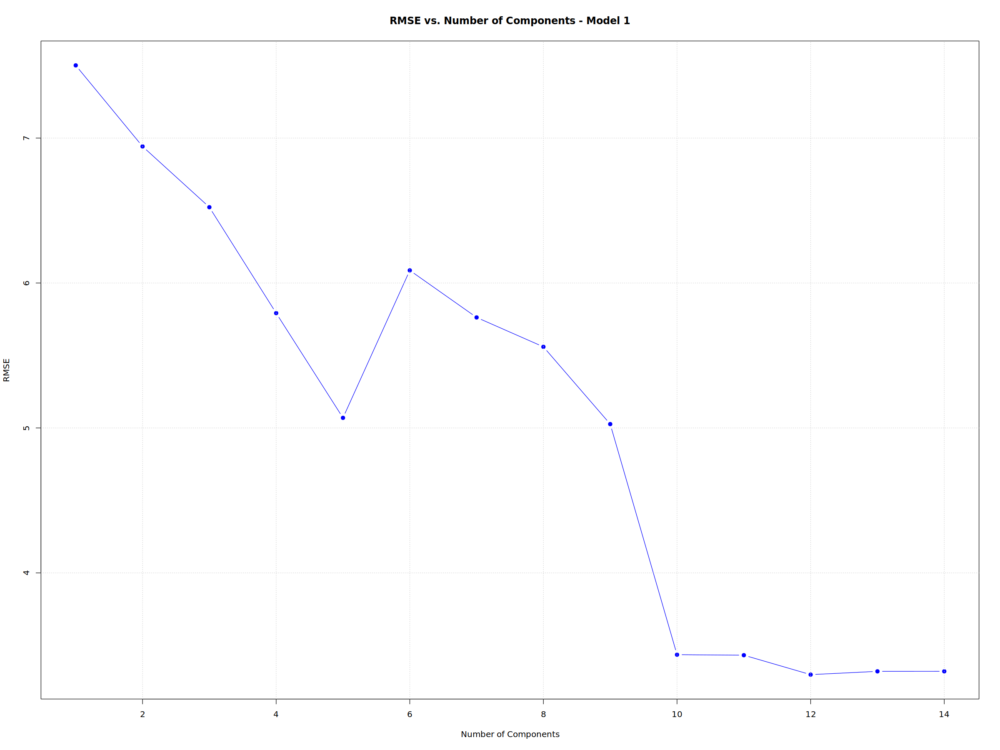

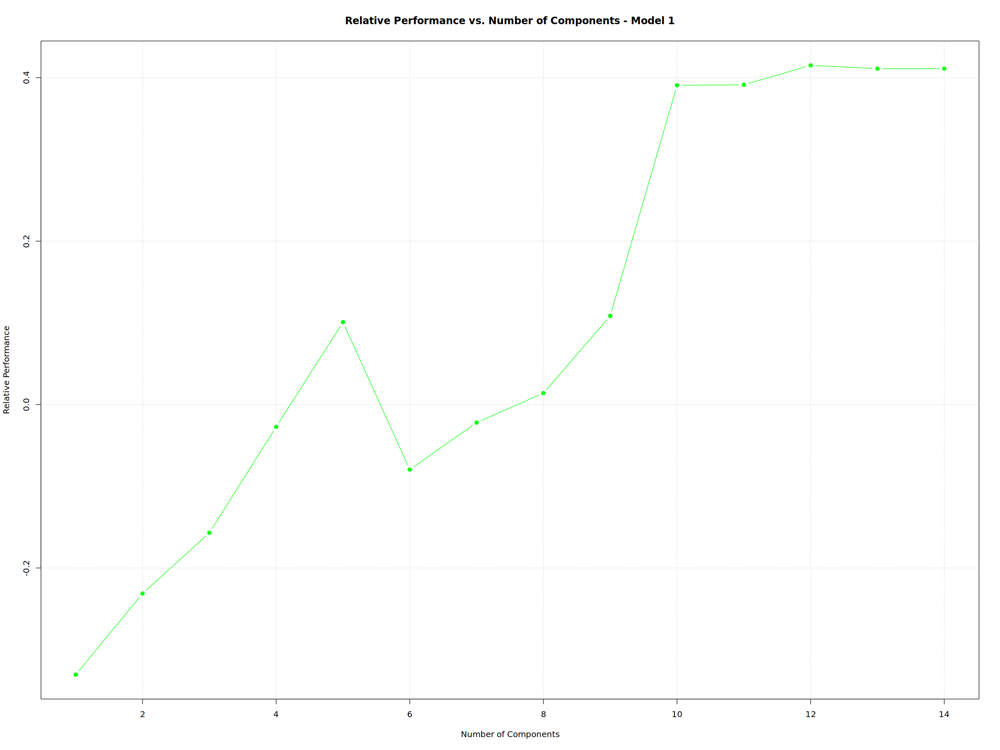

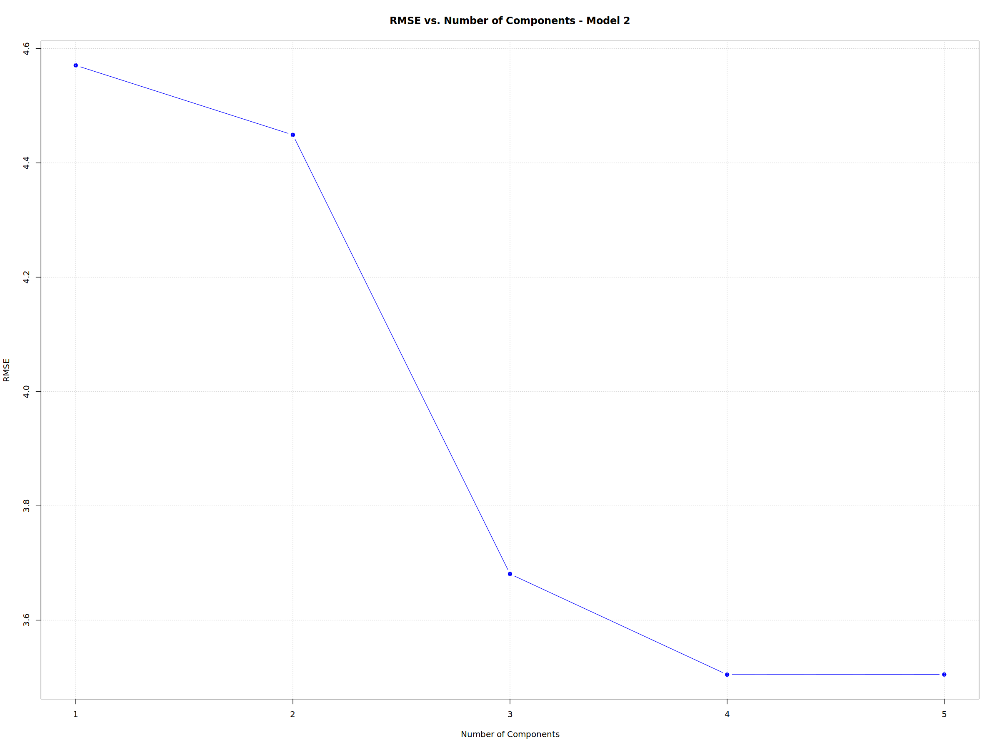

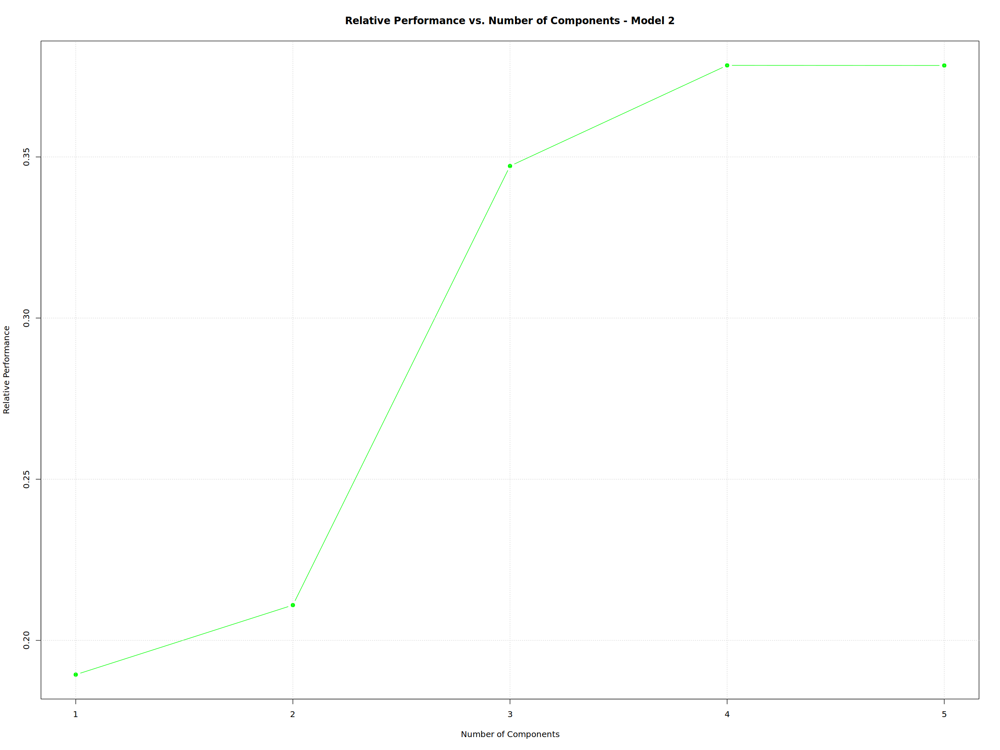

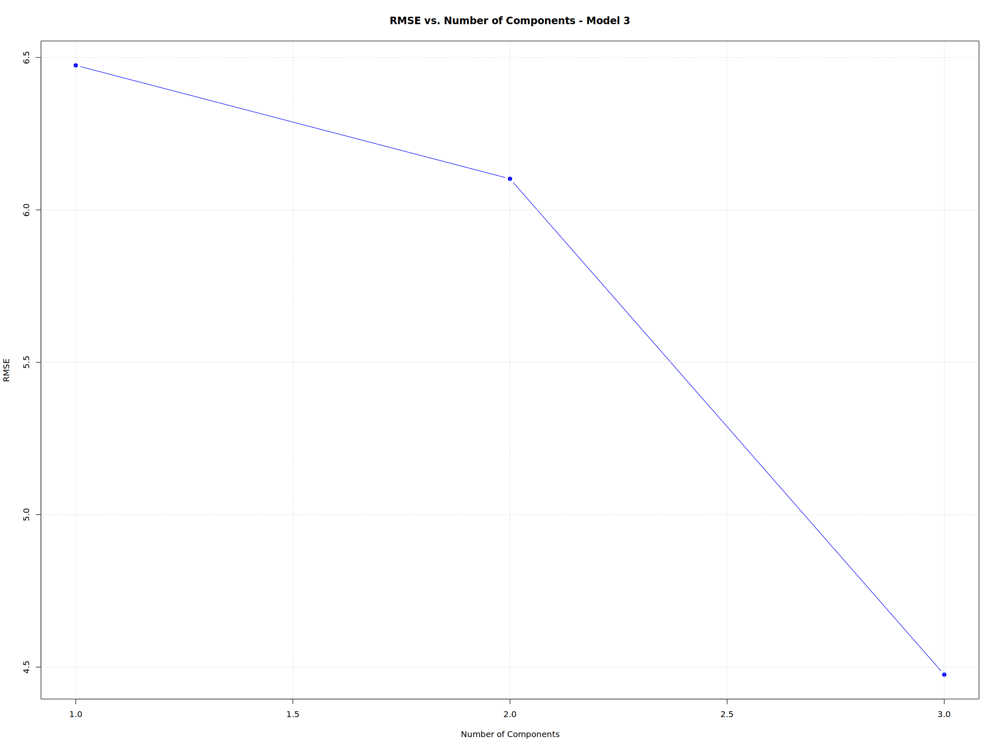

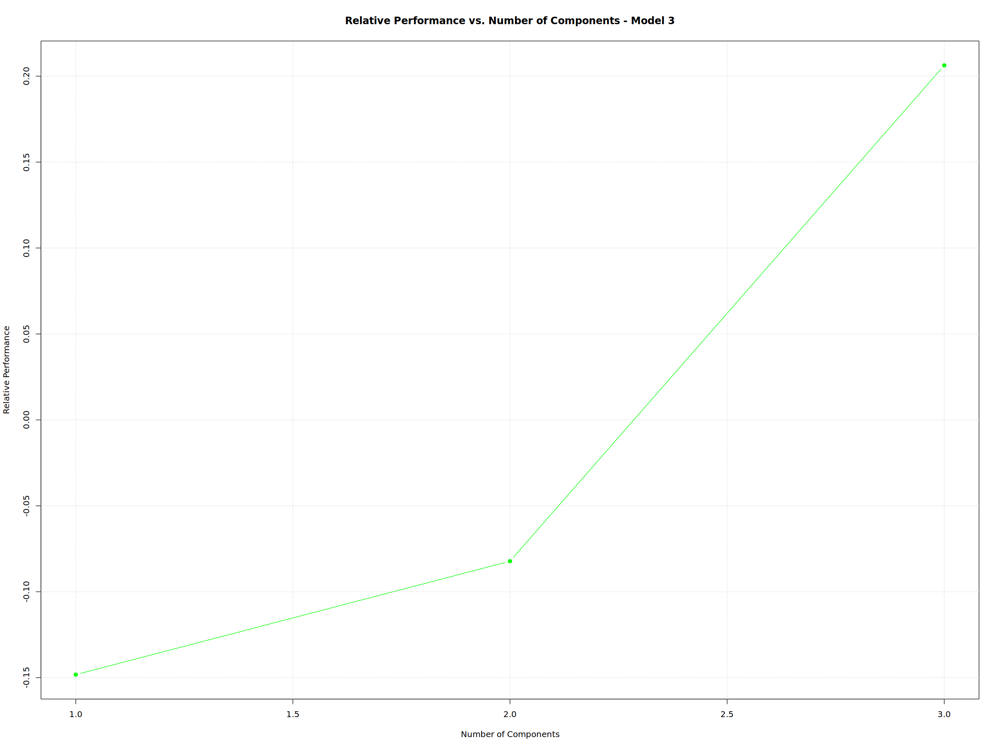

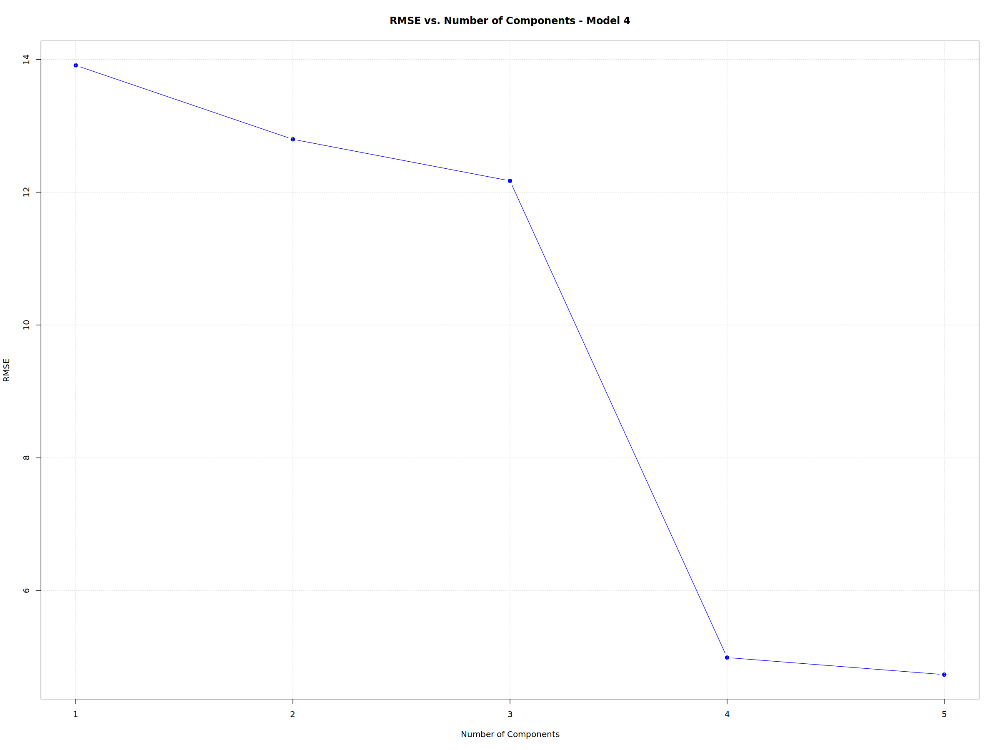

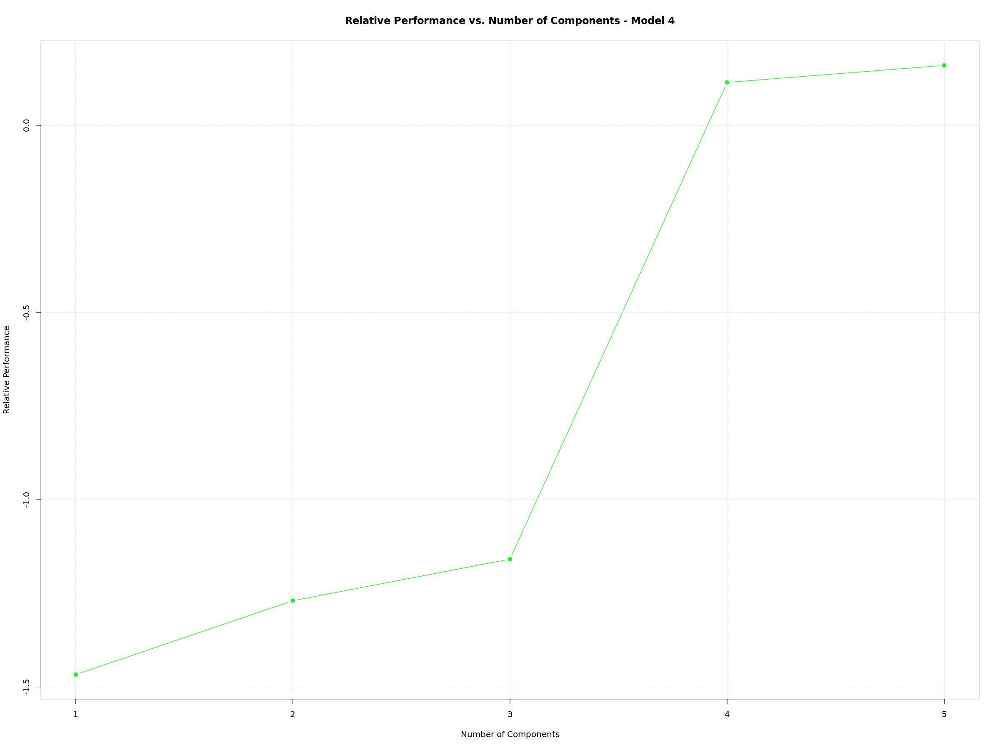

In [68]:
# Define the number of components for each model
ncomp <- c(14, 5, 3, 5)

# Initialize matrices to store results
mse <- matrix(NA, nrow = length(ncomp), ncol = max(ncomp))
relative_performance <- matrix(NA, nrow = length(ncomp), ncol = max(ncomp))

# Loop through each model
for (i in seq_along(ncomp)) {
    # Loop through each value of ncomp for the current model
    for (c in 1:ncomp[i]) {
        # Make predictions using the PCR model with current ncomp
        pcr_pred <- predict(get(paste0("pcr_model", i)), newdata = get(paste0("pcr_model", i, "_test_subset")), ncomp = c)
        
        # Calculate mean squared error for the PCR model predictions
        mse[i, c] <- mean((test$obs - pcr_pred)^2, na.rm = TRUE)
    }
    
    # Calculate mean squared error for the dmo model
    mse.dmo <- mean((test$obs - test$dmo)^2, na.rm = TRUE)
    
    # Calculate relative performance for each ncomp of the current model
    relative_performance[i, ] <- 1 - mse[i, ] / mse.dmo
    
    # Plot RMSE vs. ncomp for the current model
    plot(1:ncomp[i], mse[i, 1:ncomp[i]], type = 'b', pch = 19, col = 'blue',
         xlab = 'Number of Components', ylab = 'RMSE',
         main = paste("RMSE vs. Number of Components - Model", i))
    grid()

    # Plot relative performance vs. ncomp for the current model
    plot(1:ncomp[i], relative_performance[i, 1:ncomp[i]], type = 'b', pch = 19, col = 'green',
         xlab = 'Number of Components', ylab = 'Relative Performance',
         main = paste("Relative Performance vs. Number of Components - Model", i))
    grid()
}


## Our Best setup  using PCR method is using all variables as  predictors. 


The hyperparameter tuning for the PCR model is conducted using sequential cross-validation with the trainControl function in the caret package. The train function evaluates different combinations of principal components by setting tuneLength = 14 to explore all possible components (14 variables). The timeslice method splits the data into an initial training window of 1825 days and a rolling horizon of 365 days, skipping 365 days between windows.

**Overall R-squared: 0.890596951510592**

**Overall RMSE: 2.19179625142437**

**Overall MSE: 4.8039708077579**

Forecast at Station: 460 (1 from 49)
[1] "Relative Performance (PCR Model) for Station 460 : 0.419008366390679"
[1] "MSE (PCR Model) for Station 460 : 3.27583793639948"
[1] "MSE (DMO) for Station 460 : 5.63835647003872"
[1] "optimum number of components for Station 460 : 13"
Forecast at Station: 662 (2 from 49)
[1] "Relative Performance (PCR Model) for Station 662 : 0.228325221940128"
[1] "MSE (PCR Model) for Station 662 : 4.08581986842635"
[1] "MSE (DMO) for Station 662 : 5.29474330973837"
[1] "optimum number of components for Station 662 : 12"
Forecast at Station: 691 (3 from 49)
[1] "Relative Performance (PCR Model) for Station 691 : 0.16118612377611"
[1] "MSE (PCR Model) for Station 691 : 4.99478685762416"
[1] "MSE (DMO) for Station 691 : 5.95458301203757"
[1] "optimum number of components for Station 691 : 10"
Forecast at Station: 704 (4 from 49)
[1] "Relative Performance (PCR Model) for Station 704 : 0.0870099068377312"
[1] "MSE (PCR Model) for Station 704 : 5.48177092618926"
[1]

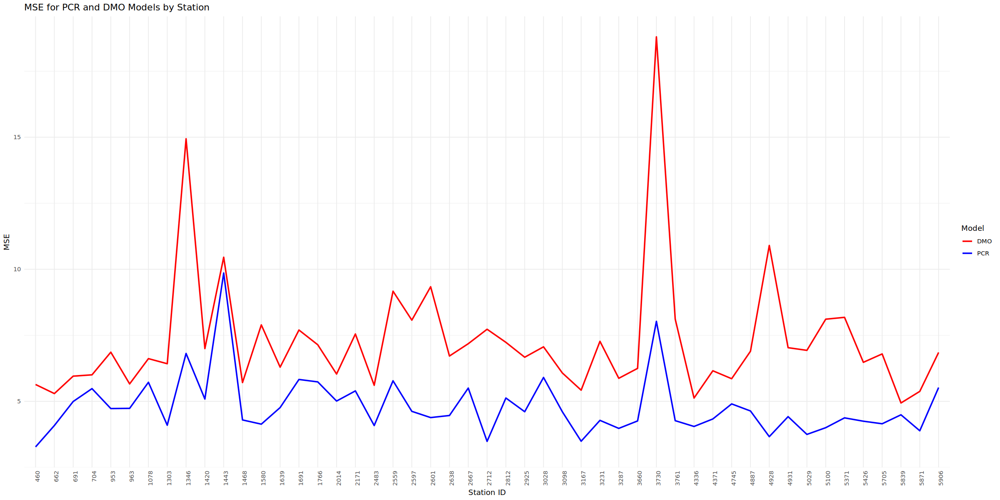

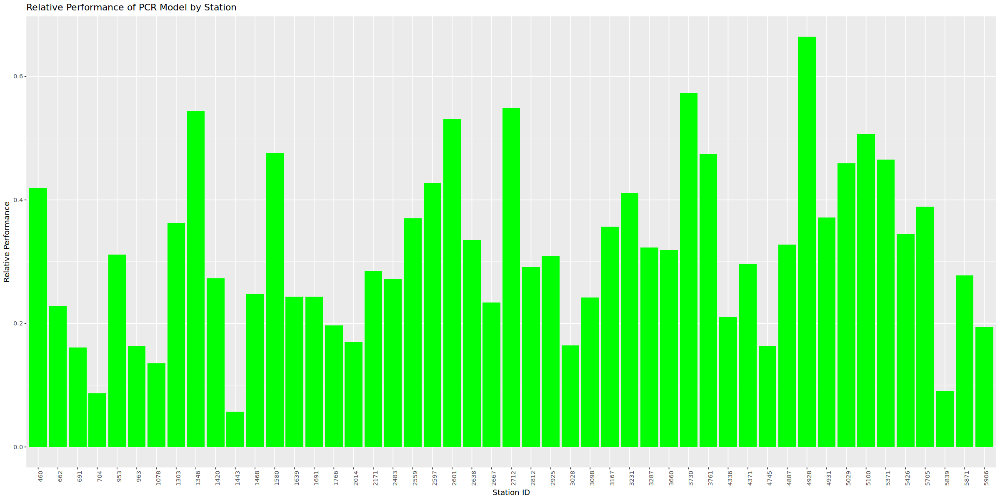

In [9]:


# Set seed for reproducibility
set.seed(123)


observed_values <- numeric(0)
predicted_values <- numeric(0)
# Initialize a matrix to store predictions for all stations
num_stations <- length(unique(fcs.test$latlon$station.id))
my.pred <- matrix(data = NA, nrow = 730, ncol = num_stations) 

# Initialize vectors to store MSE and relative performance for each station
station_ids <- unique(fcs.test$latlon$station.id)
mse_pcr_values <- numeric(length(station_ids))
mse_dmo_values <- numeric(length(station_ids))
relative_performance_values <- numeric(length(station_ids))

# Loop over stations
for (st in station_ids) {
  cat(paste0('Forecast at Station: ', st, ' (', which(fcs.test$latlon$station.id == st), ' from ', num_stations, ')\n'))
  
  # Select fixed lead time of 120 hours
  this_station <- st
  this_leadtime <- 120
  
  # Prepare test data for this station and lead time
  idx.lt <- which(obs.test$leadtime == this_leadtime)
  idx.sta <- which(obs.test$latlon$station.id == this_station)
  obs <- obs.test$data$t2m[idx.lt,,idx.sta]
  time <- obs.test$time + this_leadtime * 3600
  obs <- cbind(obs.test$time, this_leadtime, this_station, obs)
  obs <- zoo(obs, time)
  colnames(obs) <- c('init', 'lt', 'stat', 'obs')
  
  idx.lt <- which(fcs.test$leadtime == this_leadtime)
  dmo <- fcs.test$data$t2m[idx.lt,,idx.sta]
  tp6 <- fcs.test$data$tp6[idx.lt,,idx.sta]
  sshf6 <- fcs.test$data$sshf6[idx.lt,,idx.sta]
  slhf6 <- fcs.test$data$slhf6[idx.lt,,idx.sta]
  ssr6 <- fcs.test$data$ssr6[idx.lt,,idx.sta]
  str6 <- fcs.test$data$str6[idx.lt,,idx.sta]
  cp6 <- fcs.test$data$cp6[idx.lt,,idx.sta]
  mx2t6 <- fcs.test$data$mx2t6[idx.lt,,idx.sta]
  mn2t6 <- fcs.test$data$mn2t6[idx.lt,,idx.sta]
  ssrd6 <- fcs.test$data$ssrd6[idx.lt,,idx.sta]
  strd6 <- fcs.test$data$strd6[idx.lt,,idx.sta]
  p10fg6 <- fcs.test$data$p10fg6[idx.lt,,idx.sta]
  
  # Combine all parameters into the test data frame
  test <- cbind(dmo, tp6, sshf6, slhf6, ssr6, str6, cp6, mx2t6, mn2t6, ssrd6, strd6, p10fg6)
  time <- fcs.test$time + this_leadtime * 3600
  test <- zoo(test, time)
  test <- merge(obs, test)
  
  # Prepare training data
  trai.all <- NULL
  for (year in fcs.train$year) {
    idx.lt <- which(obs.train$leadtime == this_leadtime)
    idx.year <- which(obs.train$year == year)
    idx.sta <- which(obs.train$latlon$station.id == this_station)
    obs <- obs.train$data$t2m[idx.lt, idx.year, , idx.sta]
    year.dummy <- as.POSIXct(paste0(2017 - 20 + year, '-01-02'))
    time <- year.dummy + obs.train$time * 3600 * 24 + this_leadtime * 3600
    fctime_obs_trai <- year.dummy + obs.train$time * 3600 * 24
    obs <- cbind(fctime_obs_trai, this_leadtime, this_station, obs)
    obs <- zoo(obs, time)
    colnames(obs) <- c('init', 'lt', 'stat', 'obs')
    
    idx.lt <- which(fcs.train$leadtime == this_leadtime)
    idx.year <- which(fcs.train$year == year)
    idx.sta <- which(fcs.train$latlon$station.id == this_station)
    dmo <- fcs.train$data$t2m[idx.lt, idx.year, , idx.sta]
    tp6 <- fcs.train$data$tp6[idx.lt, idx.year, , idx.sta]
    sshf6 <- fcs.train$data$sshf6[idx.lt, idx.year, , idx.sta]
    slhf6 <- fcs.train$data$slhf6[idx.lt, idx.year, , idx.sta]
    ssr6 <- fcs.train$data$ssr6[idx.lt, idx.year, , idx.sta]
    str6 <- fcs.train$data$str6[idx.lt, idx.year, , idx.sta]
    cp6 <- fcs.train$data$cp6[idx.lt, idx.year, , idx.sta]
    mx2t6 <- fcs.train$data$mx2t6[idx.lt, idx.year, , idx.sta]
    mn2t6 <- fcs.train$data$mn2t6[idx.lt, idx.year, , idx.sta]
    ssrd6 <- fcs.train$data$ssrd6[idx.lt, idx.year, , idx.sta]
    strd6 <- fcs.train$data$strd6[idx.lt, idx.year, , idx.sta]
    p10fg6 <- fcs.train$data$p10fg6[idx.lt, idx.year, , idx.sta]
    
    trai <- cbind(dmo, tp6, sshf6, slhf6, ssr6, str6, cp6, mx2t6, mn2t6, ssrd6, strd6, p10fg6)
    time <- year.dummy + fcs.train$time * 3600 * 24 + this_leadtime * 3600
    trai <- zoo(trai, time)
    trai <- merge(obs, trai)
    trai.all <- rbind(trai.all, trai)
  }
  
  trai <- na.omit(trai.all)
  trai <- trai[which(index(trai) < as.POSIXct('2017-01-01')),]
  
  # Convert K to °C (run only once!)
  trai$obs <- trai$obs - 273.15
  test$obs <- test$obs - 273.15
  trai$dmo <- trai$dmo - 273.15
  test$dmo <- test$dmo - 273.15
  trai$mx2t6 <- trai$mx2t6 - 273.15
  test$mx2t6 <- test$mx2t6 - 273.15
  
  # Adding sine and cosine for day of the year to capture seasonality
  yday <- as.POSIXlt(index(trai))$yday
  trai$sin.doy <- sin(2 * pi * yday / 365)
  trai$cos.doy <- cos(2 * pi * yday / 365)
  
  yday <- as.POSIXlt(index(test))$yday
  test$sin.doy <- sin(2 * pi * yday / 365)
  test$cos.doy <- cos(2 * pi * yday / 365)
  
  # Fit PCR model
  control <- trainControl(
    method = "timeslice", 
    initialWindow = 1825,  # Initial training window size (e.g., first 500 samples)
    horizon = 365,        # Size of the rolling window (e.g., 100 samples)
    fixedWindow = TRUE,   # Use a fixed rolling window
    skip = 365,           # Number of samples to skip between each window
    returnResamp = "all"  # Return predictions for all samples
  )
  
  # Train your model using train function with sequential cross-validation
  pcr_model <- train(
    obs ~ dmo + cos.doy + sin.doy + tp6 + sshf6 + slhf6 + ssr6 + str6 + cp6 + mx2t6 + mn2t6 + ssrd6 + strd6 + p10fg6,
    data = trai,
    method = "pcr",
    trControl = control,
    preProcess = c("center", "scale"),
    tuneLength = 14
    #metric = "RMSE"  # Tune over all possible components (14 variables)
  )
  
  # Access number of components used in the final model
  num_components <- pcr_model$finalModel$ncomp
  
  # Predict using PCR model
  pcr_pred <- predict(pcr_model, newdata = test)
  
  # Store the predictions in the matrix
  my.pred[, which(fcs.test$latlon$station.id == st)] <- pcr_pred
  
  # Evaluate performance
  mse.pcr <- mean((test$obs - pcr_pred)^2, na.rm = TRUE)
  mse.dmo <- mean((test$obs - test$dmo)^2, na.rm = TRUE)
  relative_performance_pcr <- 1 - mse.pcr / mse.dmo
  print(paste("Relative Performance (PCR Model) for Station", st, ":", relative_performance_pcr))
  print(paste("MSE (PCR Model) for Station", st, ":", mse.pcr))
  print(paste("MSE (DMO) for Station", st, ":", mse.dmo))
  print(paste("optimum number of components for Station", st, ":", num_components))  

  observed_values <- c(observed_values, test$obs)
  predicted_values <- c(predicted_values, pcr_pred)
    
    
  # Store MSE and relative performance
  station_index <- which(station_ids == st)
  mse_pcr_values[station_index] <- mse.pcr
  mse_dmo_values[station_index] <- mse.dmo
  relative_performance_values[station_index] <- relative_performance_pcr
}

saveRDS(my.pred, file = "my.PCR.MOS_group_X.rds")

# Overall performance
na_indices <- which(!is.na(observed_values) & !is.na(predicted_values))
observed_values <- observed_values[na_indices]
predicted_values <- predicted_values[na_indices]

overall_r_squared <- cor(observed_values, predicted_values)^2
overall_rmse <- sqrt(mean((observed_values - predicted_values)^2))
overall_mse <- mean((observed_values - predicted_values)^2)

# Print overall metrics
print(paste("Overall R-squared:", overall_r_squared))
print(paste("Overall RMSE:", overall_rmse))
print(paste("Overall MSE:", overall_mse))

# Create a data frame for plotting
plot_data <- data.frame(
  StationID = as.factor(station_ids),
  MSE_PCR = mse_pcr_values,
  MSE_DMO = mse_dmo_values,
  RelativePerformance = relative_performance_values
)

# Line plot for MSE comparison
mse_plot <- ggplot(plot_data, aes(x = StationID)) +
  geom_line(aes(y = MSE_PCR, color = "PCR", group = 1), size = 1) +
  geom_line(aes(y = MSE_DMO, color = "DMO", group = 1), size = 1) +
  labs(title = "MSE for PCR and DMO Models by Station", y = "MSE", x = "Station ID") +
  scale_color_manual(name = "Model", values = c("PCR" = "blue", "DMO" = "red")) +
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 90, hjust = 1))

# Set plot size using options
options(repr.plot.width = 20, repr.plot.height = 10)



# Print the MSE plot
print(mse_plot)





# Relative performance plot
relative_performance_plot <- ggplot(plot_data, aes(x = StationID, y = RelativePerformance)) +
  geom_bar(stat = "identity", fill = "green") +
  labs(title = "Relative Performance of PCR Model by Station", y = "Relative Performance", x = "Station ID") +
  theme(axis.text.x = element_text(angle = 90, hjust = 1))



print(relative_performance_plot)



[1] 730  49
            [,1]       [,2]       [,3]       [,4]         [,5]       [,6]
[1,] -2.04047485 -3.2420721 -2.8140428 -3.0648255 -1.545065628 -2.5072840
[2,] -4.64143242 -1.7527855 -0.5042315 -0.1648490 -3.362470423 -0.6068436
[3,] -1.09704751  2.7589186  3.6831825  4.1157713 -1.551319720  3.4668362
[4,]  0.63978303  0.4059581  1.7583302  1.2318602  1.098030095  1.9121704
[5,] -0.31035983  2.2160865  3.2753732  3.2835198 -0.248224068  3.0512818
[6,]  0.09416223  0.4215684  0.4338351  0.5074533 -0.006325666  0.8660974
          [,7]       [,8]       [,9]      [,10]      [,11]      [,12]
[1,] -0.391403 -0.1789649  -6.200370 -2.8271546 -3.3652065 -2.5497043
[2,] -1.121749 -1.3956516 -10.635776 -4.7858801 -8.3213072 -9.6420199
[3,]  3.471611  3.3739521  -6.210276  1.3890275 -0.7598394 -3.4110121
[4,]  2.074379  1.9774960  -2.525154  0.7121598  1.0630706 -0.6622431
[5,]  3.882593  2.9414054  -3.434780  1.1711655 -0.2564307 -0.8409347
[6,]  1.622858  2.4163893  -4.577654 -0.4501666 -0

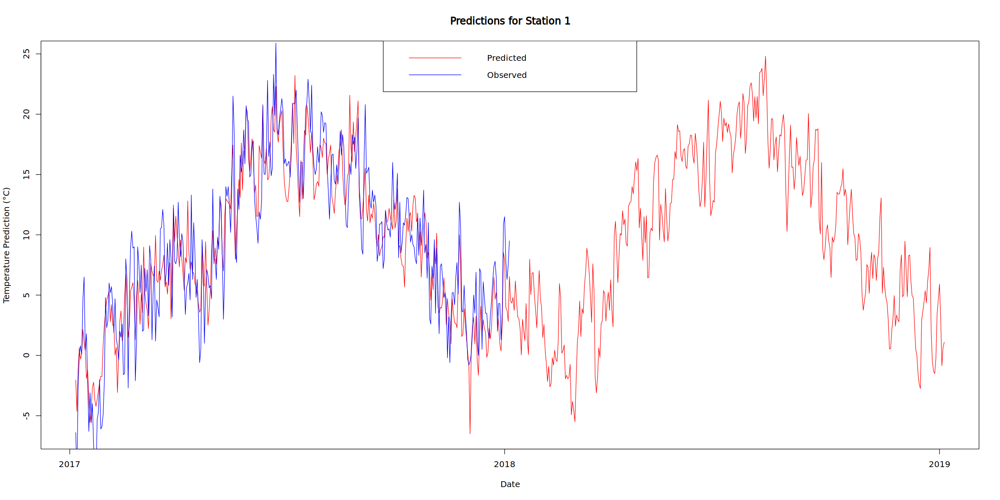

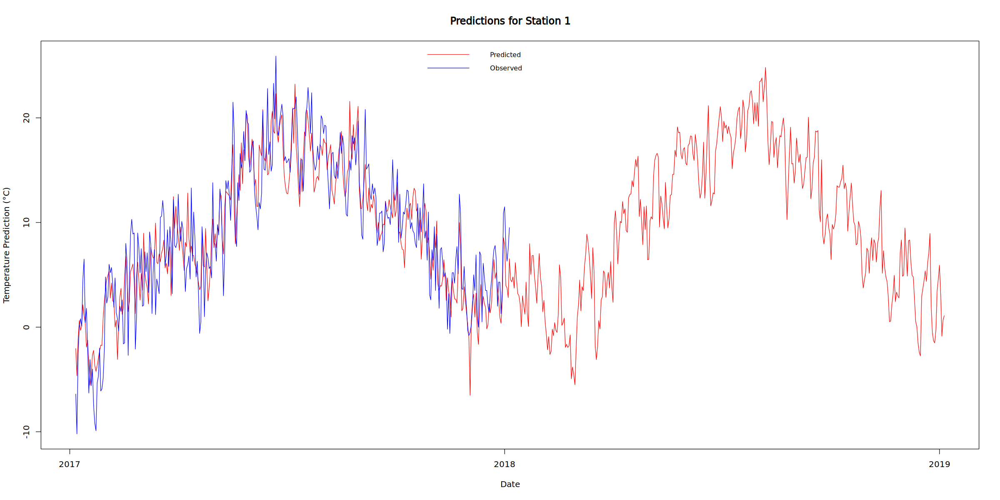

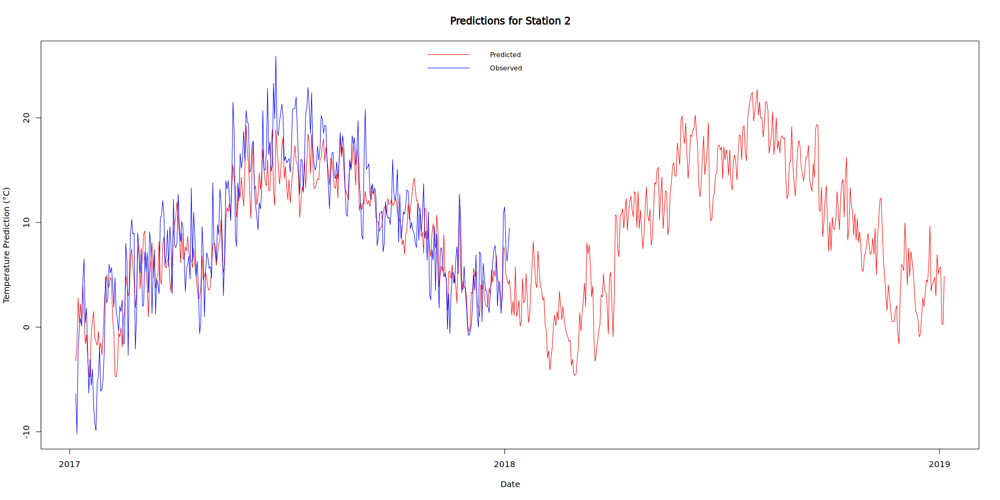

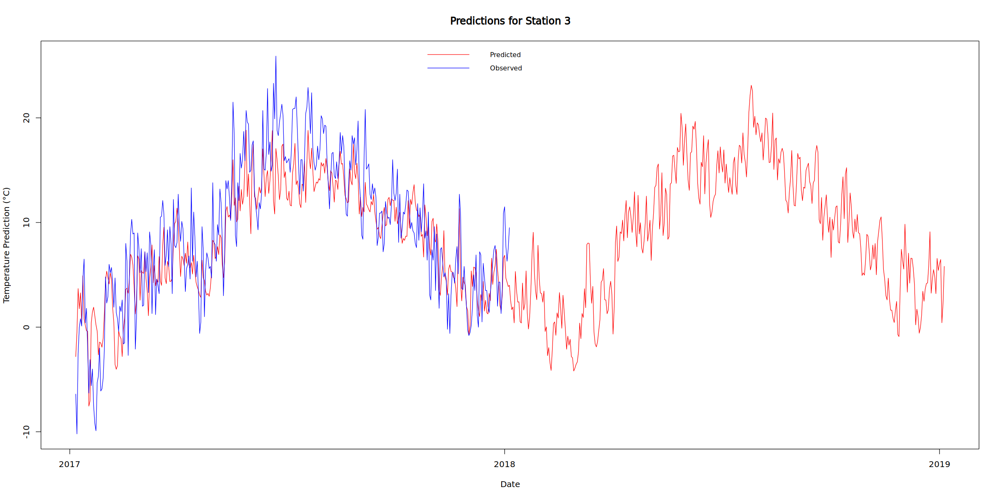

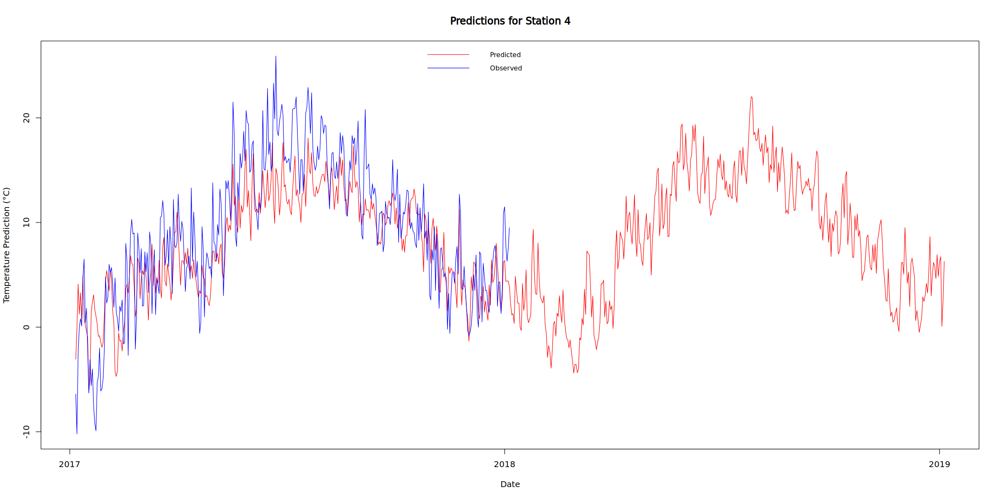

...

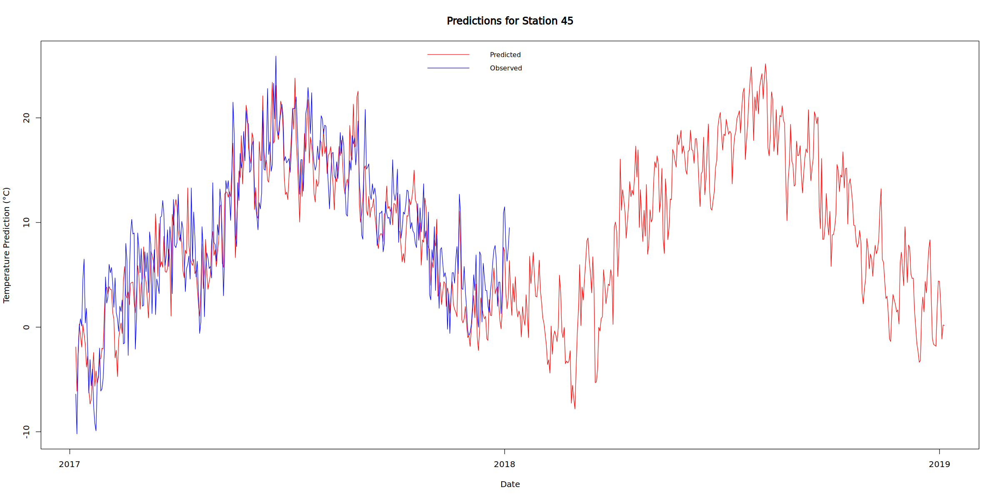

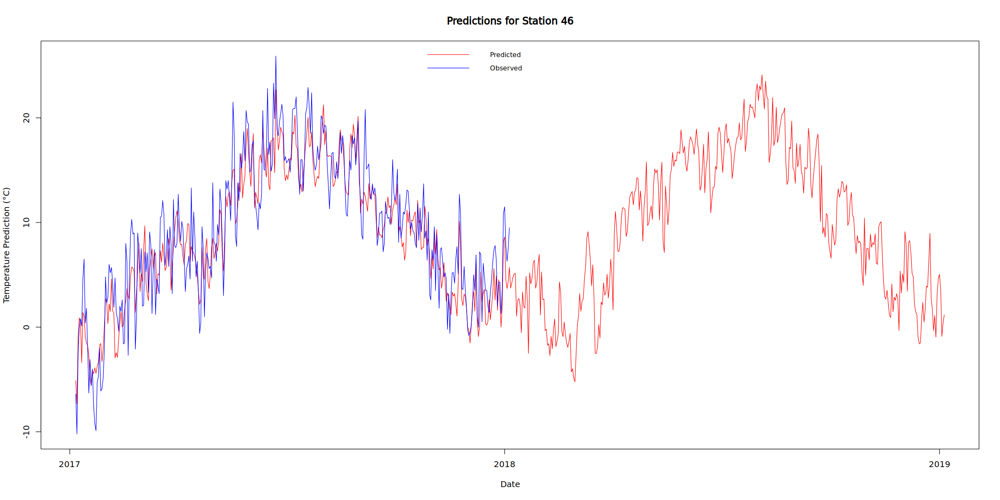

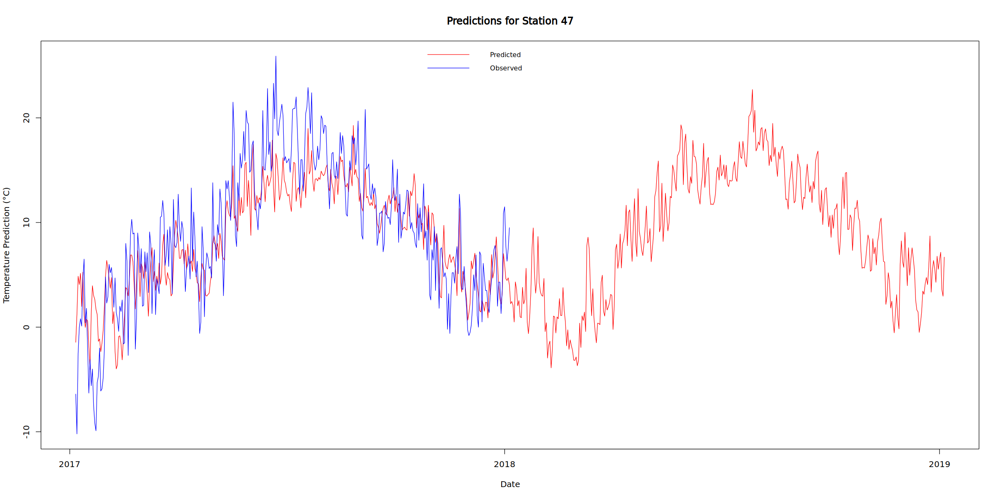

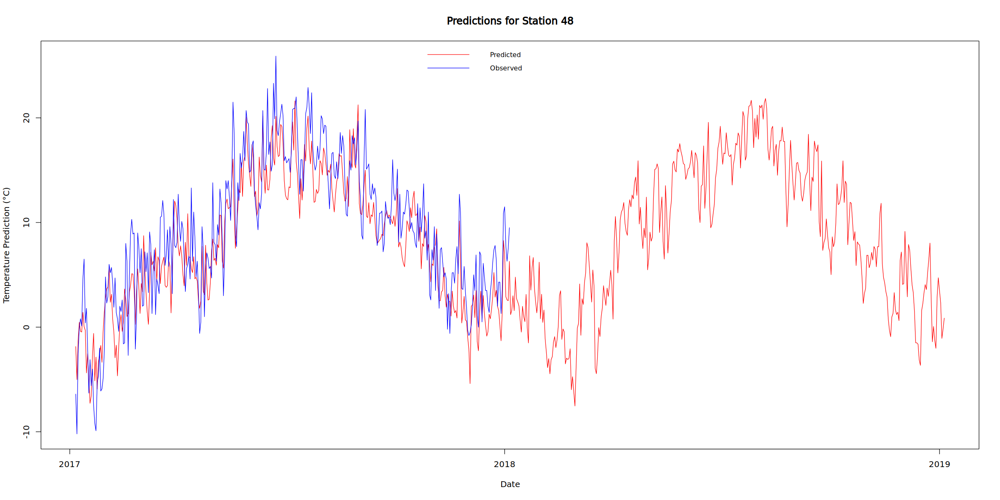

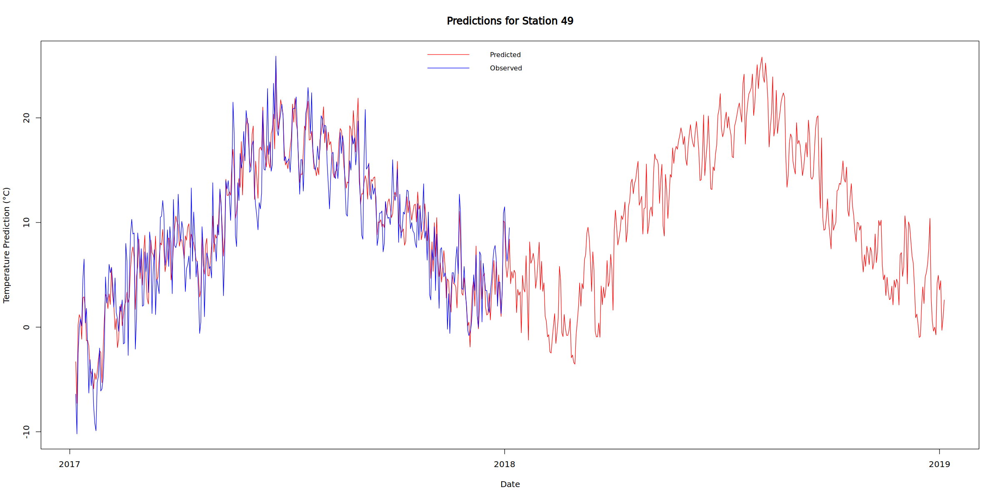

In [56]:
# Load the RDS file
loaded_data <- readRDS("my.PCR.MOS_group_X.rds")

# Inspect the dimensions of the data
print(dim(loaded_data))

# Check the first few rows and columns of the data
print(head(loaded_data))

# Plot the data for a specific station
# Assuming you want to plot the data for the first station (adjust the index as needed)
station_index <- 1
dates <- as.Date(rownames(data.frame(test)))

# Ensure dates match the dimensions of the loaded data
if(length(dates) == nrow(loaded_data)) {
  plot(dates, loaded_data[, station_index], type = 'l', col = "red", xlab = "Date", ylab = "Temperature Prediction (°C)", main = paste("Predictions for Station", station_index))
  lines(dates, test$obs, col = "blue")
  legend("top", legend = c("Predicted", "Observed"), col = c("red", "blue"), lty = 1)
} else {
  cat("Dates and prediction data dimensions do not match!\n")
}

# Optional: Loop through all stations and create separate plots
num_stations <- ncol(loaded_data)



# Set a larger plot size
options(repr.plot.width = 20, repr.plot.height = 10)

# Loop over stations to create plots
for (station_index in 1:num_stations) {
  # Determine y-axis limits
  y_min <- min(c(loaded_data[, station_index], test$obs), na.rm = TRUE)
  y_max <- max(c(loaded_data[, station_index], test$obs), na.rm = TRUE)
  
  # Create the plot with adjusted y-axis limits
  plot(dates, loaded_data[, station_index], type = 'l', col = "red", 
       xlab = "Date", ylab = "Temperature Prediction (°C)", 
       main = paste("Predictions for Station", station_index),
       ylim = c(y_min, y_max))
  
  # Add observed data
  lines(dates, test$obs, col = "blue")
  
  # Add legend at top center
  legend("top", legend = c("Predicted", "Observed"), col = c("red", "blue"), lty = 1, bty = "n", cex = 0.8)
  
  # Optionally, save each plot as an image file
  # dev.copy(png, filename = paste0("station_", station_index, ".png"))
  # dev.off()
}